## Install a package from a different conda channel

Open a terminal and run the following commands:

    conda activate <ENV_NAME>
    conda install -c conda-forge pandas-profiling -y
  
- The `<ENV_NAME>` refers to the name of the environment you'll be working with for this project
- The `!` indicates a terminal command
- The `-c` flag indicates the channel we're using to get the package
- The `-y` flag indicates that we're confirming the installation of pandas-profiling and its dependencies a priori

We're installing `pandas-profiling` through this method because Anaconda's `default` channel contains an outdated version of this package, whereas the channel `conda-forge` has an updated version.

In [4]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil


! pip install pandas-profiling

# notice we are adding two new imports for visualizations; This was not here last class
from itertools import product
from pandas_profiling import ProfileReport

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Seeting seaborn style
sns.set()

  Using cached pandas_profiling-3.1.0-py2.py3-none-any.whl (261 kB)
  Using cached pydantic-1.8.2-cp38-cp38-win_amd64.whl (2.0 MB)
  Using cached phik-0.12.0-cp38-cp38-win_amd64.whl (659 kB)
  Using cached htmlmin-0.1.12-py3-none-any.whl
  Using cached missingno-0.5.0-py3-none-any.whl (8.8 kB)
  Using cached ImageHash-4.2.1-py2.py3-none-any.whl


# Context
The data we will be using through the pratical classes comes from a small relational database whose schema can be seen below:
![alt text](../figures/schema.png "Relation database schema")

# Reading the Data

In [3]:
# path to database
my_path = os.path.join("Data-Mining-21-22", "data", "datamining.db")

# connect to the database
conn = sqlite3.connect(my_path)

# the query (SQL)
query = """
SELECT
    age, 
    income, 
    frq, 
    rcn, 
    mnt, 
    clothes, 
    kitchen, 
    small_appliances, 
    toys, 
    house_keeping,
    dependents, 
    per_net_purchase,
    g.gender, 
    e.education, 
    m.status, 
    r.description
FROM customers as c
    JOIN genders AS g ON g.id = c.gender_id
    JOIN education_levels AS e ON e.id = c.education_id
    JOIN marital_status AS m ON m.id = c.marital_status_id
    JOIN recommendations AS r ON r.id = c.recommendation_id
ORDER BY c.id;
"""

df = pd.read_sql_query(query, conn)

# Metadata
- *id* - The unique identifier of the customer
- *age* - The year of birht of the customer
- *income* - The income of the customer
- *frq* - Frequency: number of purchases made by the customer
- *rcn* - Recency: number of days since last customer purchase
- *mnt* - Monetary: amount of € spent by the customer in purchases
- *clothes* - Number of clothes items purchased by the customer
- *kitchen* - Number of kitchen items purchased by the customer
- *small_appliances* - Number of small_appliances items purchased by the customer
- *toys* - Number of toys items purchased by the customer
- *house_keeping* - Number of house_keeping items purchased by the customer
- *dependents* - Binary. Whether or not the customer has dependents
- *per_net_purchase* - Percentage of purchases made online
- *education* - Education level of the customer
- *status* - Marital status of the customer
- *gender* - Gender of the customer
- *description* - Last customer's recommendation description

# Initial Analysis

Pandas user guide: https://pandas.pydata.org/pandas-docs/stable/user_guide/index.html

Pandas 10 min tutorial: https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html

In [4]:
# dataset head
df.head(10)

,age,income,frq,rcn,mnt,clothes,kitchen,small_appliances,toys,house_keeping,dependents,per_net_purchase,gender,education,status,description
0,1946,90782,33,66,1402,37,5,44,10,3,0,19,M,Graduation,Together,Take my money!!
1,1936,113023,32,6,1537,55,1,38,4,2,0,9,F,PhD,Divorced,Take my money!!
2,1990,28344,11,69,44,32,19,24,1,24,1,59,M,Graduation,Married,Kind of OK
3,1955,93571,26,10,888,60,10,19,6,5,1,35,F,Master,,OK nice!
4,1955,91852,31,26,1138,59,5,28,4,4,1,34,F,Graduation,Together,Take my money!!
5,1982,22386,14,65,56,47,2,48,2,1,1,67,M,PhD,Single,OK nice!
6,1969,69485,18,73,345,71,7,13,1,8,1,46,M,Graduation,Together,OK nice!
7,1960,68602,5,44,41,84,1,12,2,0,1,37,M,Graduation,Together,Horrible
8,1940,109499,30,75,1401,38,9,35,9,9,0,17,M,Graduation,Divorced,OK nice!
9,1994,23846,8,153,19,18,55,17,10,1,1,39,F,1st Cycle,Together,Meh...


In [5]:
# dataset data types
#income should not be object --> it is classified like this because it has empty strings
# dependents, gender, education, etc have also incorrect data types
df.dtypes

age                  int64
income              object
frq                  int64
rcn                  int64
mnt                  int64
clothes              int64
kitchen              int64
small_appliances     int64
toys                 int64
house_keeping        int64
dependents          object
per_net_purchase     int64
gender              object
education           object
status              object
description         object
dtype: object

In [6]:
# int('')
# returns an error

In [7]:
# count of missing values
# missing values do not appear becuase df is waiting for the None type and not an empty string
df.isna().sum()

age                 0
income              0
frq                 0
rcn                 0
mnt                 0
clothes             0
kitchen             0
small_appliances    0
toys                0
house_keeping       0
dependents          0
per_net_purchase    0
gender              0
education           0
status              0
description         0
dtype: int64

In [8]:
# Not a number value
np.nan

nan

In [9]:
# duplicated observations
df.duplicated().sum()


#To see if it exists duplicated observations in a subset
#df.duplicated(subset=['frq', 'mnt', 'rcn']).sum()


# to see the documentation of some functions
# df.duplicated?

0

In [10]:
# descriptive statistics
df.describe(include="all").T  # try with all and without all
#.T gives the transpose matrix

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,8998.0,NaN,NaN,NaN,1966.05968,17.296552,1936.0,1951.0,1966.0,1981.0,1996.0
income,8998,8525,,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN
frq,8998.0,NaN,NaN,NaN,19.848077,10.903435,3.0,10.0,17.0,28.0,59.0
rcn,8998.0,NaN,NaN,NaN,62.469771,69.761802,0.0,26.0,53.0,79.0,549.0
mnt,8998.0,NaN,NaN,NaN,622.162814,646.768205,6.0,63.0,383.0,1076.0,3052.0
clothes,8998.0,NaN,NaN,NaN,50.446655,23.422249,1.0,33.0,51.0,69.0,99.0
kitchen,8998.0,NaN,NaN,NaN,7.039675,7.848139,0.0,2.0,4.0,10.0,75.0
small_appliances,8998.0,NaN,NaN,NaN,28.524116,12.586437,1.0,19.0,28.0,37.0,74.0
toys,8998.0,NaN,NaN,NaN,7.036897,7.924422,0.0,2.0,4.0,10.0,62.0
house_keeping,8998.0,NaN,NaN,NaN,6.929984,7.882655,0.0,2.0,4.0,9.0,77.0


## Problems:
- Duplicates?
- Data types?
- Missing values?
- Strange values?
- Descriptive statistics?

### Take a closer look and point out possible problems:

(hint: a missing values in pandas is represented with a NaN value)

In [11]:
# Use this cell to further explore the dataset


In [12]:
# replace "" by nans (not a number)
df.replace("", np.nan, inplace=True)
# because I´m not passing it to a new variable, iI'm not changing the real dataset
# two solutions: either create a variable to store this dataset or pass the argument inplace=True

In [13]:
# count of missing values
df.isna().sum()

age                   0
income               46
frq                   0
rcn                   0
mnt                   0
clothes               0
kitchen               0
small_appliances      0
toys                  0
house_keeping         0
dependents          282
per_net_purchase      0
gender                0
education            47
status              177
description           0
dtype: int64

In [14]:
# check dataset data types again
df.dtypes

age                   int64
income              float64
frq                   int64
rcn                   int64
mnt                   int64
clothes               int64
kitchen               int64
small_appliances      int64
toys                  int64
house_keeping         int64
dependents          float64
per_net_purchase      int64
gender               object
education            object
status               object
description          object
dtype: object

In [15]:
# ANother way to access column of df
# only possible if name is not already built inside python and if it has no empty spaces
df.income

0        90782.0
1       113023.0
2        28344.0
3        93571.0
4        91852.0
          ...   
8993     94367.0
8994     58121.0
8995     54292.0
8996    125962.0
8997     26385.0
Name: income, Length: 8998, dtype: float64

In [16]:
# fix wrong dtypes
#df['dependents'] = df['dependents'].astype("bool") 
# converting to "boolean" over "bool" allows preservation of NaNs


In [17]:
# check descriptive statistics again
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,8998.0,NaN,NaN,NaN,1966.05968,17.296552,1936.0,1951.0,1966.0,1981.0,1996.0
income,8952.0,NaN,NaN,NaN,69963.550827,27591.556226,10000.0,47741.0,70030.5,92218.0,140628.0
frq,8998.0,NaN,NaN,NaN,19.848077,10.903435,3.0,10.0,17.0,28.0,59.0
rcn,8998.0,NaN,NaN,NaN,62.469771,69.761802,0.0,26.0,53.0,79.0,549.0
mnt,8998.0,NaN,NaN,NaN,622.162814,646.768205,6.0,63.0,383.0,1076.0,3052.0
clothes,8998.0,NaN,NaN,NaN,50.446655,23.422249,1.0,33.0,51.0,69.0,99.0
kitchen,8998.0,NaN,NaN,NaN,7.039675,7.848139,0.0,2.0,4.0,10.0,75.0
small_appliances,8998.0,NaN,NaN,NaN,28.524116,12.586437,1.0,19.0,28.0,37.0,74.0
toys,8998.0,NaN,NaN,NaN,7.036897,7.924422,0.0,2.0,4.0,10.0,62.0
house_keeping,8998.0,NaN,NaN,NaN,6.929984,7.882655,0.0,2.0,4.0,9.0,77.0


# Visual Exploration

Matplotlib tutorials: https://matplotlib.org/3.3.1/tutorials/index.html

Matplotlib gallery: https://matplotlib.org/3.3.1/tutorials/introductory/sample_plots.html#sphx-glr-tutorials-introductory-sample-plots-py

Seaborn tutorials: https://seaborn.pydata.org/tutorial.html


Seaborn gallery: https://seaborn.pydata.org/examples/index.html

**More examples for visualizing distributions:**
- http://seaborn.pydata.org/tutorial/distributions.html

In [18]:
# Define metric and non-metric features. Why?
# We will analyze them in a different manner 
# Barplot:frequency of categorical data, histgram: frequency of certain bins

non_metric_features = ["education", "status", "gender", "dependents", "description"]

#drop these column
# .to_list() is an alternative to list() function
metric_features = df.columns.drop(non_metric_features).to_list()
# metric_features is a list of columns

## Pyplot-style vs Object-Oriented-style
- Explicitly create figures and axes, and call methods on them (the "object-oriented (OO) style").
- Rely on pyplot to automatically create and manage the figures and axes, and use pyplot functions for plotting.

## Numeric Variables' Univariate Distribution

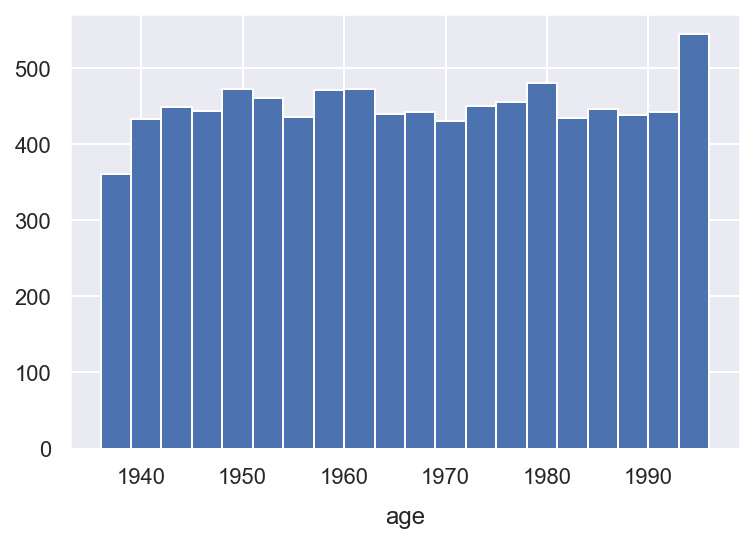

In [19]:
# Single Metric Variable Histogram
plt.hist(df["age"], bins=20)  # mess around with the bins
# play with the y axe so it is more visual
# y is negative because we want it to appear below the graphic
plt.title("age", y=-0.2)

plt.show()

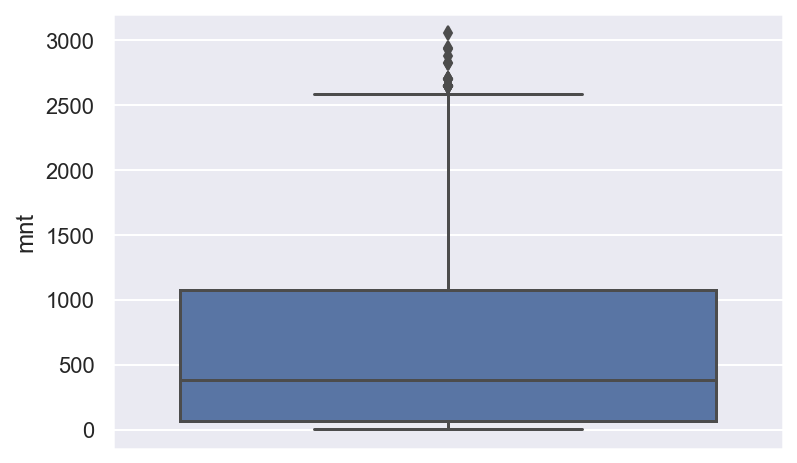

In [20]:
# Single Metric Variable Box Plot
sns.boxplot(y=df["mnt"])

# Not necessary to see the plot but nicer presentation
plt.show()

What information can we extract from the plots above?

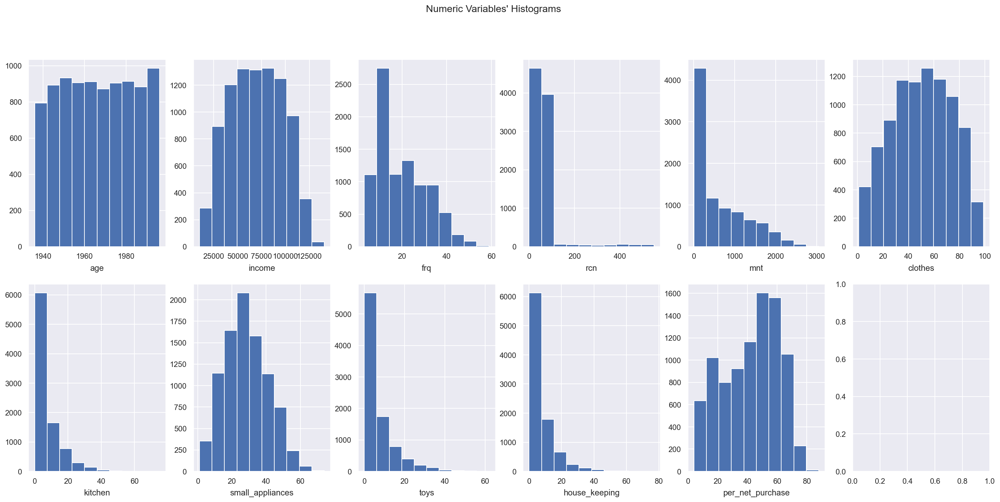

In [21]:
# All Numeric Variables' Histograms in one figure
sns.set()

# Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(25, 11))
# subplot, 2 rows, number of columns, size of the figure

# Plot data
# Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and 
    # flatten() method so we have everthing in a single list
    # metric_features is a list of the name of the columns
    ax.hist(df[feat])
    ax.set_title(feat, y=-0.15)
    
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Histograms"
plt.suptitle(title)

# Show all the plots
plt.show()

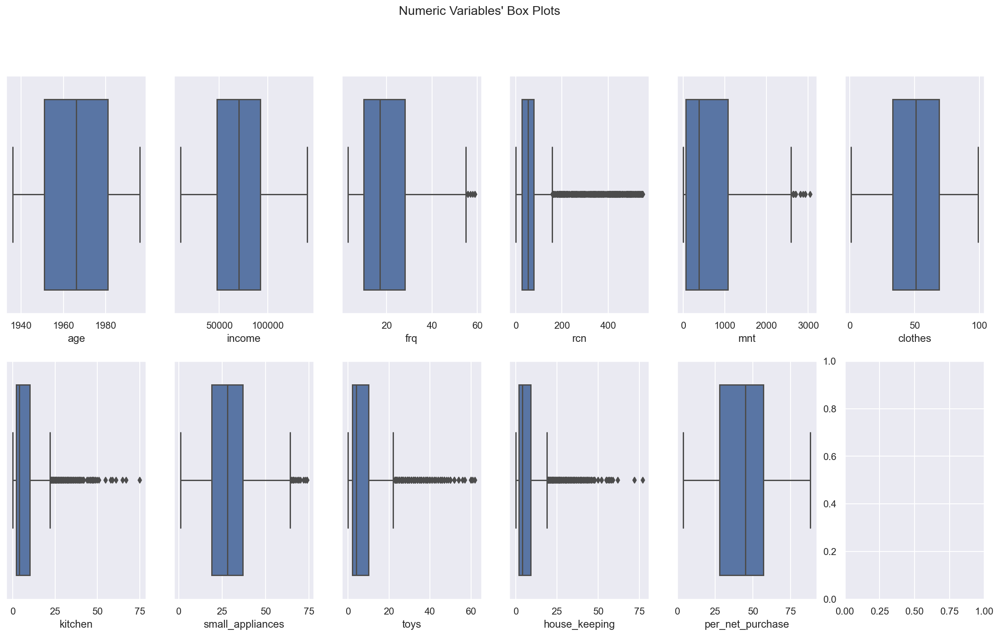

In [22]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

### Insights:
- univariate distributions
- potential univariate outliers

### During our Exploratory Data Analysis (EDA), we must also account for:
- Coherence check
- Outliers
- Missing values
- Feature Engineering

### Depending on the context, various steps must be considered when performing Data Preprocessing. The most relevant steps are the following:
- Coherence check (find inconsistent values, missing values, outliers and any other problem you may find in your dataset)
- Data editing (fix inconsistent values)
- Data cleansing (drop observations - Outlier removal and removal of inconsistent values and/or features)
- Data wrangling (feature extraction/engineering and transformation)
- Data reduction (reducing the dimensionality of a dataset, producing summary statistics, reducing the number of records in a dataset)

# More Visualizations!

## Pairwise Relationship of Numerical Variables

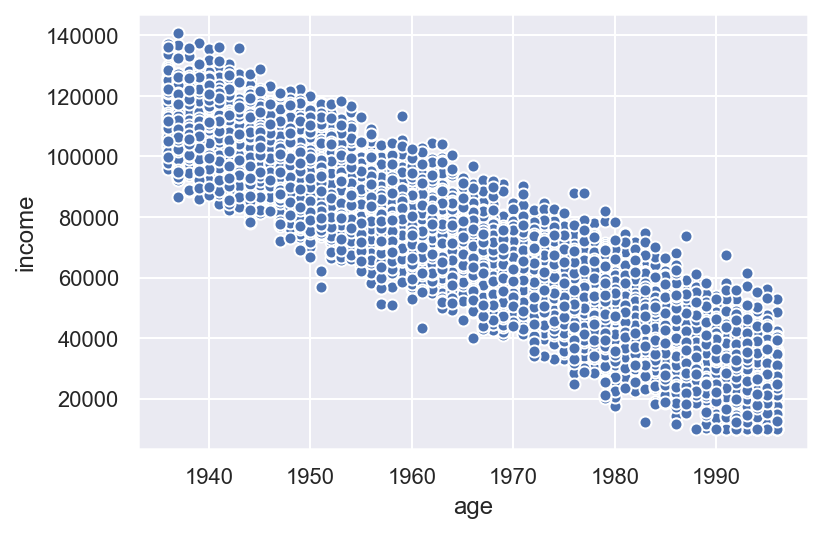

In [23]:
# Single Metric Variable Scatter plot
plt.scatter(df["age"], df["income"], edgecolors="white")
plt.xlabel("age")
plt.ylabel("income")

plt.show()

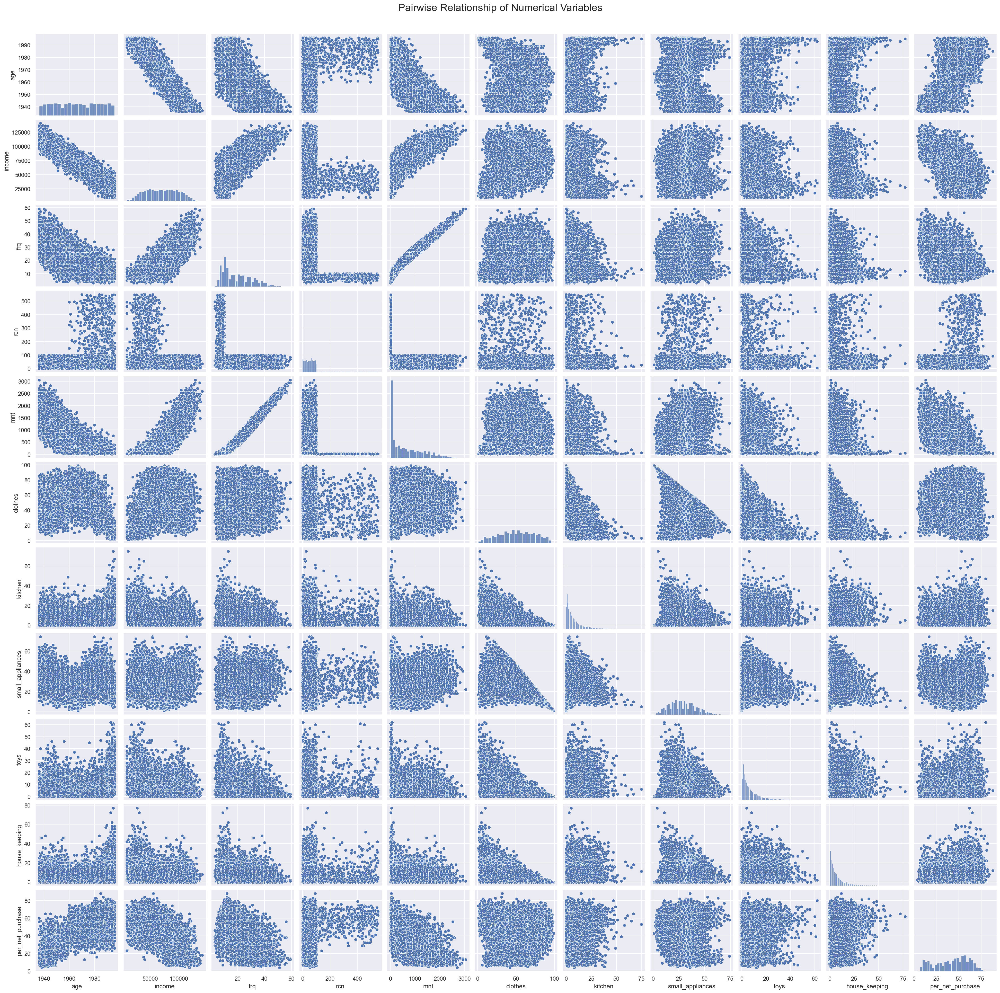

In [57]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

### Insights:
- possible bivariate relationships
- potential bivariate outliers
- univariate distributions (diagonal)

### Example of Visualization formatting

In [ ]:
# making a joint plot with default formatting
sns.jointplot(data=df, x="house_keeping", y="frq")
plt.show()

In [ ]:
# Making the same visualization with customized formatting
sns.set(style="ticks")
sns.jointplot(data=df, x="house_keeping", y="frq", kind="hex", color="red")
plt.show()

## Categorical/Low Cardinality Variables' Absolute Frequencies

In [ ]:
# Single Non-Metric variable bar plot
sns.set() # this resets our formatting defaults
sns.countplot(x=df["education"])

plt.show()

In [ ]:
# formatting the color of a simple bar chart
sns.countplot(x=df["education"], color='#007acc')

# try replacing the color to 'red' or 'blue', instead of using an RGB code.
# alterntively, you can get the RGB code for a given color here:
# https://www.w3schools.com/colors/colors_picker.asp
# keep in mind any other color picker will do just as well

plt.show()

What information can we extract from the plot above?

**Using the same logic from the multiple box plot figure above, build a multiple bar plot figure for each non-metric variable:**

In [ ]:
# All Non-Metric Variables' Absolute Frequencies
sns.set()
title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
# CODE HERE

### Insights:
- low frequency values
- high cardinality

## Comparing two categorical variables

In [ ]:
# Let's break this down, step by step (pandas plot - matplotlib behind)
sns.set()
df_counts = df\
    .groupby(['description', 'dependents'])\
    .size()\
    .unstack()\
    .plot.bar(stacked=True)

## Comparing a categorical variable vs continuous (or discrete) variables

In [ ]:
# Pairwise Relationship of Numerical Variables using a categorical variable hue
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features + ['gender']], diag_kind="hist", hue='gender')

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

## Explore categorical data vs continuous and discrete data

Another example of visualization. Although it is not a simple visualization to produce, it can be very informative. Let's start off simple and then let's customize the plot's appearance.

In [ ]:
# notice we drop missing values in order to not plot it as a distinct value
educ_vals = df.education.dropna().unique()

fig, axes = plt.subplots(len(metric_features), len(educ_vals), figsize=(25,18), sharex=True, sharey="row")

for ax, (feat, educ_deg) in zip(axes.flatten(), product(metric_features, educ_vals)):
    # get the data for each subplot
    data = df[df.education == educ_deg]
    data['dependents'] = data['dependents'].astype(object)
    
    # we are distinguishing points according to the variable "dependents"
    sns.pointplot(x="dependents", y=feat, hue="gender", hue_order=["F", "M"], data=data, capsize=.2,
             height=6, aspect=.75, ax=ax)
    
    # remove the typical default y and x labels and legend of each axis
    # CODE HERE

# set columns' titles (education)
# CODE HERE

# set metric names
# CODE HERE

# set x axis label (dependents)
# CODE HERE

# Set legend (gender)
# CODE HERE

# set figure
plt.subplots_adjust(top=0.92)
plt.suptitle("Three-way ANOVA for each metric variable", fontsize=25)

plt.show()

## Metric Variables' Correlation Matrix

In [ ]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = # CODE HERE

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

# A tool to assist you through your exploratory data analysis

Optionally, you may use `pandas-profiling` as a first approach to your data analysis. Remember, although this tool provides excelent insights about the data you're working with, it is not enough to perform a proper analysis.

In [24]:
profile = ProfileReport(
    df, 
    title='Tugas Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

In [25]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]